<a href="https://colab.research.google.com/github/pw0908/Caltech-CS155-2022/blob/main/sets/set1/3_notebook_part1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem 3, Parts C-E: Stochastic Gradient Descent Visualization

In this Jupyter notebook, we visualize how SGD works. This visualization corresponds to parts C-E of question 3 in set 1.

Use this notebook to write your code for problem 3 parts C-E by filling in the sections marked `# TODO` and running all cells.

In [7]:
# Install a package
!brew install imagemagick

Error: 
  homebrew-core is a shallow clone.
To `brew update`, first run:
  git -C /usr/local/Homebrew/Library/Taps/homebrew/homebrew-core fetch --unshallow
This command may take a few minutes to run due to the large size of the repository.
This restriction has been made on GitHub's request because updating shallow
clones is an extremely expensive operation due to the tree layout and traffic of
Homebrew/homebrew-core and Homebrew/homebrew-cask. We don't do this for you
automatically to avoid repeatedly performing an expensive unshallow operation in
CI systems (which should instead be fixed to not use shallow clones). Sorry for
the inconvenience!
==> Downloading https://ghcr.io/v2/homebrew/core/jbig2dec/manifests/0.19
######################################################################## 100.0%
==> Downloading https://ghcr.io/v2/homebrew/core/jbig2dec/blobs/sha256:7e70d2b24
==> Downloading from https://pkg-containers.githubusercontent.com/ghcr1/blobs/sh
################################

In [2]:
# Setup.

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, Image
from matplotlib import animation, rc

import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/charlesincharge/Caltech-CS155-2022/main/sets/set1/sgd_helper.py', 'sgd_helper.py')

from sgd_helper import (
    generate_dataset1,
    generate_dataset2,
    plot_dataset,
    plot_loss_function,
    animate_convergence,
    animate_sgd_suite
)

## Problem 3C: Implementation of SGD

Fill in the loss, gradient, and SGD functions according to the guidelines given in the problem statement in order to perform SGD.

In [56]:
def loss(X, Y, w):
    '''
    Calculate the squared loss function.
    
    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w: A (D, ) shaped numpy array containing the weight vector.
    
    Outputs:
        The loss evaluated with respect to X, Y, and w.
    '''
    
    return np.sqrt(np.mean((Y-np.dot(X,w))**2))

def gradient(x, y, w):
    '''
    Calculate the gradient of the loss function with respect to the weight vector w,
    evaluated at a single point (x, y) and weight vector w.
    
    Inputs:
        x: A (D, ) shaped numpy array containing a single data point.
        y: The float label for the data point.
        w: A (D, ) shaped numpy array containing the weight vector.
        
    Output:
        The gradient of the loss with respect to w. 
    '''

    return -2*(y-np.dot(x,w))*x

def SGD(X, Y, w_start, eta, N_epochs):
    '''
    Perform SGD using dataset (X, Y), initial weight vector w_start,
    learning rate eta, and N_epochs epochs.
    
    Inputs:
        X: A (N, D) shaped numpy array containing the data points.
        Y: A (N, ) shaped numpy array containing the (float) labels of the data points.
        w_start:  A (D, ) shaped numpy array containing the weight vector initialization.
        eta: The step size.
        N_epochs: The number of epochs (iterations) to run SGD.
        
    Outputs:
        W: A (N_epochs, D) shaped array containing the weight vectors from all iterations.
        losses: A (N_epochs, ) shaped array containing the losses from all iterations.
    '''
    W = np.ones((len(w_start),N_epochs+1))
    W[:,0] = w_start

    losses = []
    for i in range(N_epochs):
        W[:,i+1] = W[:,i]
        for j in range(len(Y)):
            grad = gradient(X[j],Y[j],W[:,i+1])
            W[:,i+1] -= grad*eta
        losses = np.append(losses,loss(X,Y,W[:,i+1]))
        
    return np.transpose(W[:,1:N_epochs+1]), losses

## Problem 3D: Visualization

### Dataset

We'll start off by generating two simple 2-dimensional datasets. For simplicity we do not consider separate training and test sets.

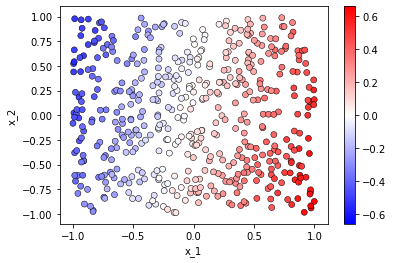

In [4]:
X1, Y1 = generate_dataset1()
plot_dataset(X1, Y1)

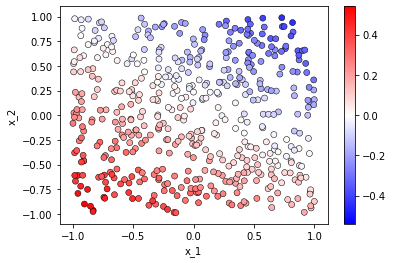

In [5]:
X2, Y2 = generate_dataset2()
plot_dataset(X2, Y2)

### SGD from a single point

First, let's visualize SGD from a single starting point:

Performing SGD with parameters {'w_start': [0.01, 0.01], 'eta': 1e-05} ...

Animating...


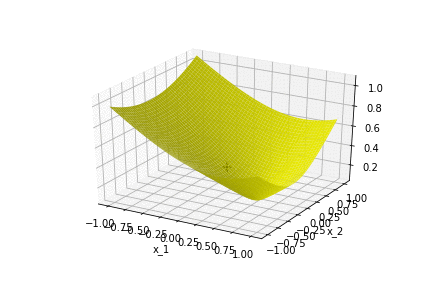

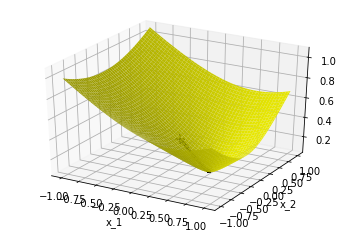

In [57]:
# Parameters to feed the SGD.
# <FR> changes the animation speed.
params = ({'w_start': [0.01, 0.01], 'eta': 0.00001},)
N_epochs = 1000
FR = 20

# Let's animate it!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)
anim.save('animation1.gif', fps=30, writer='imagemagick')
Image(open('animation1.gif','rb').read())

Let's view how the weights change as the algorithm converges:


Animating...


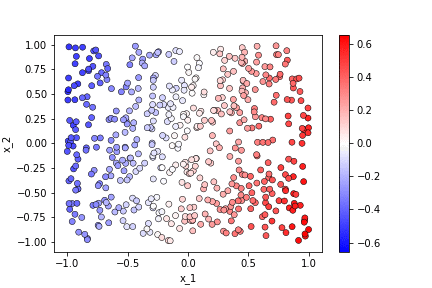

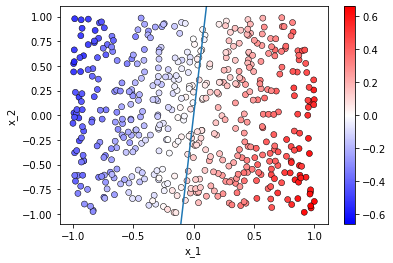

In [58]:
# Parameters to feed the SGD.
params = ({'w_start': [0.01, 0.01], 'eta': 0.00001},)
N_epochs = 1000
FR = 20

# Let's do it!
W, _ = SGD(X1, Y1, params[0]['w_start'], params[0]['eta'], N_epochs)
anim = animate_convergence(X1, Y1, W, FR)
anim.save('animation2.gif', fps=30, writer='imagemagick')
Image(open('animation2.gif','rb').read())

### SGD from multiple points

Now, let's visualize SGD from multiple arbitrary starting points:

Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


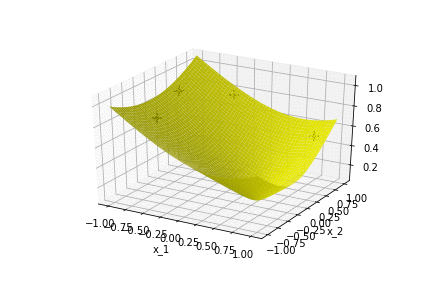

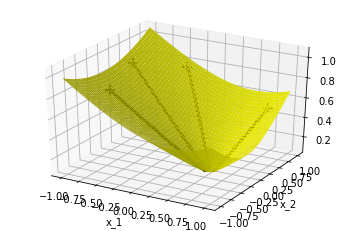

In [59]:
# Parameters to feed the SGD.
# Here, we specify each different set of initializations as a dictionary.
params = (
    {'w_start': [-0.8, -0.3], 'eta': 0.00001},
    {'w_start': [-0.9, 0.4], 'eta': 0.00001},
    {'w_start': [-0.4, 0.9], 'eta': 0.00001},
    {'w_start': [0.8, 0.8], 'eta': 0.00001},
)
N_epochs = 1000
FR = 20

# Let's go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR)
anim.save('animation3.gif', fps=30, writer='imagemagick')
Image(open('animation3.gif','rb').read())

Let's do the same thing but with a different dataset:

Performing SGD with parameters {'w_start': [-0.8, -0.3], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.9, 0.4], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [-0.4, 0.9], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.8, 0.8], 'eta': 1e-05} ...

Animating...


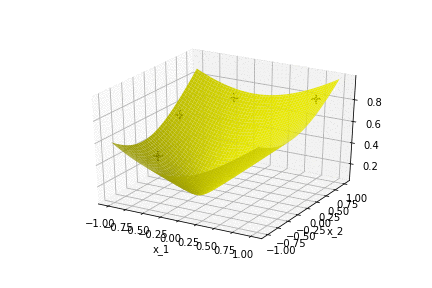

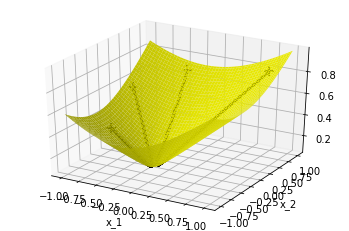

In [60]:
# Parameters to feed the SGD.
params = (
    {'w_start': [-0.8, -0.3], 'eta': 0.00001},
    {'w_start': [-0.9, 0.4], 'eta': 0.00001},
    {'w_start': [-0.4, 0.9], 'eta': 0.00001},
    {'w_start': [0.8, 0.8], 'eta': 0.00001},
)
N_epochs = 1000
FR = 20

# Animate!
anim = animate_sgd_suite(SGD, loss, X2, Y2, params, N_epochs, FR)
anim.save('animation4.gif', fps=30, writer='imagemagick')
Image(open('animation4.gif','rb').read())

## Problem 3E: SGD with different step sizes

Now, let's visualize SGD with different step sizes (eta):

(For ease of visualization: the trajectories are ordered from left to right by decreasing eta value. Also, note that we use smaller values of N_epochs and FR here for easier visualization.)

Performing SGD with parameters {'w_start': [0.7, 0.8], 'eta': 1e-05} ...
Performing SGD with parameters {'w_start': [0.2, 0.8], 'eta': 5e-05} ...
Performing SGD with parameters {'w_start': [-0.2, 0.7], 'eta': 0.0001} ...
Performing SGD with parameters {'w_start': [-0.6, 0.6], 'eta': 0.0002} ...

Animating...


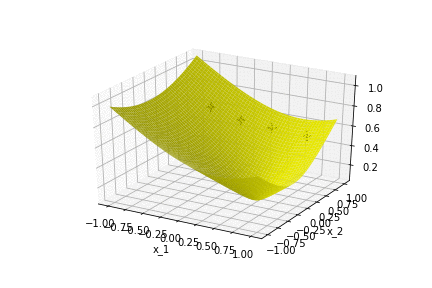

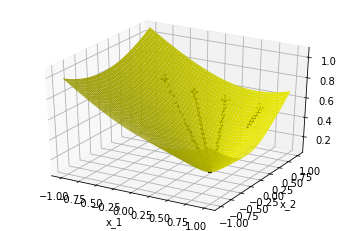

In [61]:
# Parameters to feed the SGD.
params = (
    {'w_start': [0.7, 0.8], 'eta': 0.00001},
    { 'w_start': [0.2, 0.8], 'eta': 0.00005},
    {'w_start': [-0.2, 0.7], 'eta': 0.0001},
    {'w_start': [-0.6, 0.6], 'eta': 0.0002},
)
N_epochs = 100
FR = 2

# Go!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save('animation5.gif', fps=30, writer='imagemagick')
Image(open('animation5.gif','rb').read())

### Plotting SGD Convergence

Let's visualize the difference in convergence rates a different way. Plot the loss with respect to epoch (iteration) number for each value of eta on the same graph.

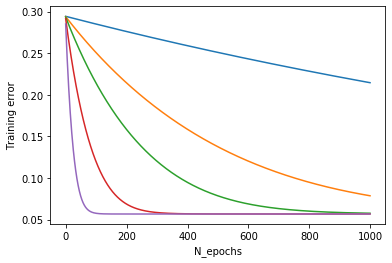

In [63]:
'''Plotting SGD convergence'''

eta_vals = [1e-6, 5e-6, 1e-5, 3e-5, 1e-4]
w_start = [0.01, 0.01]
N_epochs = 1000
plt.figure()
for eta in eta_vals:
    W,err = SGD(X1, Y1, w_start, eta, N_epochs)
    f_eval = np.dot(W,np.transpose(X1))
    # err = np.sqrt(np.mean(np.square(np.subtract(Y1,f_eval)),axis=1))
    plt.plot(range(N_epochs),err)
plt.xlabel("N_epochs")
plt.ylabel("Training error")
plt.savefig("err_train_SGD.pdf")
plt.show()



Clearly, a big step size results in fast convergence! Why don't we just set eta to a really big value, then? Say, eta=1?

(Again, note that the FR is lower for this animation.)

In [53]:
# Parameters to feed the SGD.
params = ({'w_start': [0.01, 0.01], 'eta': 1},)
N_epochs = 100
FR = 2

# Voila!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save('animation6.gif', fps=30, writer='imagemagick')
Image(open('animation6.gif','rb').read())

Performing SGD with parameters {'w_start': [0.01, 0.01], 'eta': 1} ...


TypeError: 'numpy.ndarray' object is not callable

Just for fun, let's try eta=10 as well. What happens? (Hint: look at W)

In [52]:
# Parameters to feed the SGD.
w_start = [0.01, 0.01]
eta = 10
N_epochs = 100

# Presto!
W, losses = SGD(X1, Y1, w_start, eta, N_epochs)


UnboundLocalError: local variable 'dw' referenced before assignment

## Extra Visualization (not part of the homework problem)

One final visualization! What happens if the loss function has multiple optima?

Performing SGD with parameters {'w_start': [0.9, 0.9], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [0.0, 0.0], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, 0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.8, -0.6], 'eta': 0.01} ...
Performing SGD with parameters {'w_start': [-0.4, -0.3], 'eta': 0.01} ...

Animating...


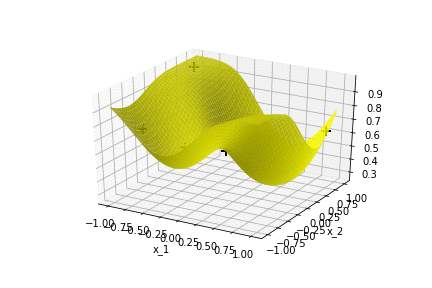

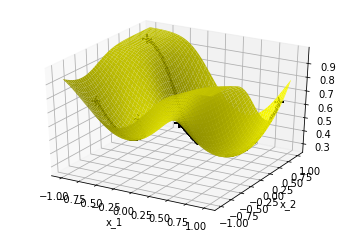

In [33]:
import urllib.request
urllib.request.urlretrieve('https://raw.githubusercontent.com/charlesincharge/Caltech-CS155-2022/main/sets/set1/sgd_multiopt_helper.py', 'sgd_multiopt_helper.py')

# Import different SGD & loss functions.
# In particular, the loss function has multiple optima.
from sgd_multiopt_helper import SGD, loss

# Parameters to feed the SGD.
params = (
    {'w_start': [0.9, 0.9], 'eta': 0.01},
    { 'w_start': [0.0, 0.0], 'eta': 0.01},
    {'w_start': [-0.8, 0.6], 'eta': 0.01},
    {'w_start': [-0.8, -0.6], 'eta': 0.01},
    {'w_start': [-0.4, -0.3], 'eta': 0.01},
)
N_epochs = 100
FR = 2

# One more time!
anim = animate_sgd_suite(SGD, loss, X1, Y1, params, N_epochs, FR, ms=2)
anim.save('animation7.gif', fps=30, writer='imagemagick')
Image(open('animation7.gif','rb').read())